# Pneumonia Chest X-Ray Dataset Visualization 🔬🧬🧪

<center>
    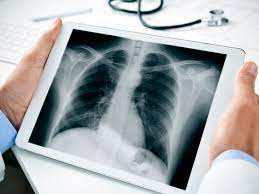
</center>

<div class="alert alert-block alert-info" style="font-size:14px; font-family:verdana;">
    📌 Dataset Link: <a href="https://www.kaggle.com/datasets/lasaljaywardena/pneumonia-chest-x-ray-dataset">https://www.kaggle.com/datasets/lasaljaywardena/pneumonia-chest-x-ray-dataset</a>
</div>

## Import Libraries

In [8]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
import random
import os
import glob
from tqdm.notebook import tqdm

import albumentations as A
import matplotlib.image as mpimg
import imageio
import scipy.ndimage as ndi

In [9]:
import warnings
warnings.filterwarnings('ignore')

## EDA (Explolatory Data Analysis) 🔍

In [10]:
# Examine the Class Split of training, testing, and validation data
train_normal = glob.glob('/kaggle/input/pneumonia-chest-x-ray-dataset/train/normal/*.jpeg')
train_pneumonia = glob.glob('/kaggle/input/pneumonia-chest-x-ray-dataset/train/pneumonia/*.jpeg')
val_normal = glob.glob('/kaggle/input/pneumonia-chest-x-ray-dataset/val/normal/*.jpeg')
val_pneumonia = glob.glob('/kaggle/input/pneumonia-chest-x-ray-dataset/val/pneumonia/*.jpeg')
test_normal = glob.glob('/kaggle/input/pneumonia-chest-x-ray-dataset/test/normal/*.jpeg')
test_pneumonia = glob.glob('/kaggle/input/pneumonia-chest-x-ray-dataset/test/pneumonia/*.jpeg')

print(f"The Training Set contains: {len(train_normal)} normal images and {len(train_pneumonia)} pneumonia images")
print(f"The Validation Set contains: {len(val_normal)} normal images and {len(val_pneumonia)} pneumonia images")
print(f"The Testing Set contains: {len(test_normal)} normal images and {len(test_pneumonia)} pneumonia images")

The Training Set contains: 1341 normal images and 3875 pneumonia images
The Validation Set contains: 8 normal images and 8 pneumonia images
The Testing Set contains: 234 normal images and 390 pneumonia images


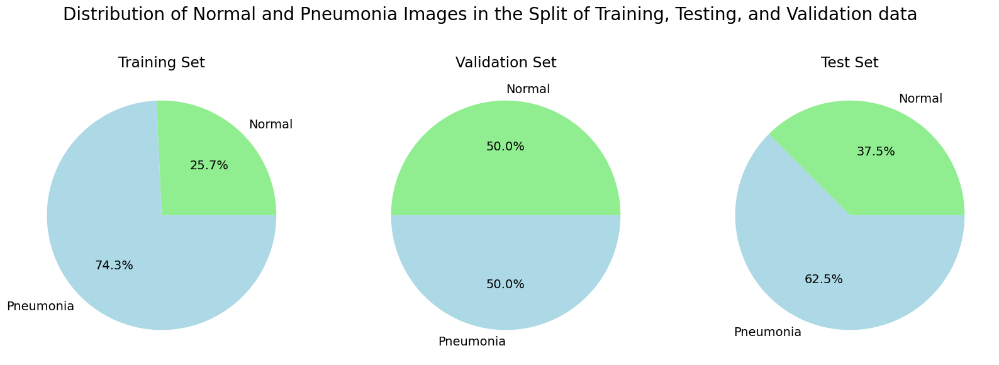

In [11]:
# Set the figure size
plt.figure(figsize=(20, 6))

# Set the font size
plt.rcParams['font.size'] = 14

# Set the colors
colors = ['lightgreen', 'lightblue']

# Plot the pie chart for the training set
plt.subplot(1, 3, 1)
plt.pie([len(train_normal), len(train_pneumonia)], labels=['Normal', 'Pneumonia'], autopct='%1.1f%%', colors=colors)
plt.title('Training Set')

# Plot the pie chart for the validation set
plt.subplot(1, 3, 2)
plt.pie([len(val_normal), len(val_pneumonia)], labels=['Normal', 'Pneumonia'], autopct='%1.1f%%', colors=colors)
plt.title('Validation Set')

# Plot the pie chart for the test set
plt.subplot(1, 3, 3)
plt.pie([len(test_normal), len(test_pneumonia)], labels=['Normal', 'Pneumonia'], autopct='%1.1f%%', colors=colors)
plt.title('Test Set')

# Add a main title to the figure
plt.suptitle('Distribution of Normal and Pneumonia Images in the Split of Training, Testing, and Validation data', fontsize=20, y=1.05)

# Show the plot
plt.show()

In [12]:
# Calculate total counts
total_normal = len(train_normal) + len(val_normal) + len(test_normal)
total_pneumonia = len(train_pneumonia) + len(val_pneumonia) + len(test_pneumonia)

# Print total counts
print(f"The total number of normal images is: {total_normal}")
print(f"The total number of pneumonia images is: {total_pneumonia}")

The total number of normal images is: 1583
The total number of pneumonia images is: 4273


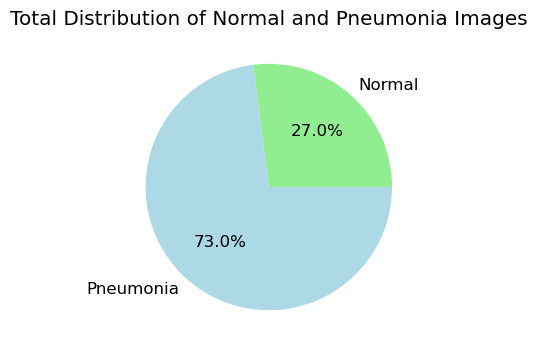

In [13]:
# Set the figure size
plt.figure(figsize=(4, 4))

# Set the font size
plt.rcParams['font.size'] = 12

# Set the colors
colors = ['lightgreen', 'lightblue']

# Plot the pie chart for the total set
plt.pie([total_normal, total_pneumonia], labels=['Normal', 'Pneumonia'], autopct='%1.1f%%', colors=colors)
plt.title('Total Distribution of Normal and Pneumonia Images')

# Show the plot
plt.show()

In [14]:
# Examine the Data Split of training, testing, and validation data
train_data = glob.glob('/kaggle/input/pneumonia-chest-x-ray-dataset/train/**/*.jpeg')
val_data = glob.glob('/kaggle/input/pneumonia-chest-x-ray-dataset/val/**/*.jpeg')
test_data = glob.glob('/kaggle/input/pneumonia-chest-x-ray-dataset/test/**/*.jpeg')

print(f"The Training Set contains: {len(train_data)} images")
print(f"The Validation Set contains: {len(val_data)} images")
print(f"The Testing Set contains: {len(test_data)} images")

The Training Set contains: 5216 images
The Validation Set contains: 16 images
The Testing Set contains: 624 images


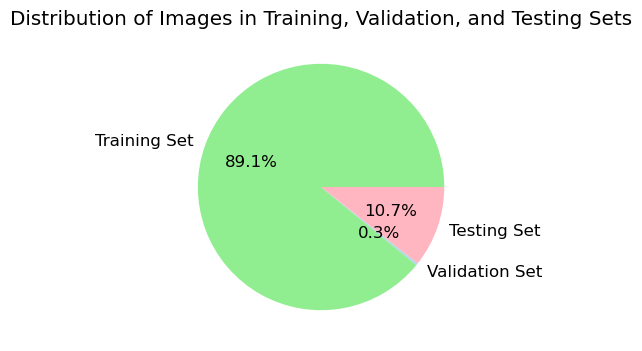

In [15]:
# Calculate total counts
total_train = len(train_data)
total_val = len(val_data)
total_test = len(test_data)

# Set the figure size
plt.figure(figsize=(4, 4))

# Set the font size
plt.rcParams['font.size'] = 12

# Set the colors
colors = ['lightgreen', 'lightblue', 'lightpink']

# Plot the pie chart for the total set
plt.pie([total_train, total_val, total_test], labels=['Training Set', 'Validation Set', 'Testing Set'], autopct='%1.1f%%', colors=colors)
plt.title('Distribution of Images in Training, Validation, and Testing Sets')

# Show the plot
plt.show()

## Data Visualization 📈 

### Randomly Visualize X-ray Images

In [48]:
# Function to visualize a random image from a dataset
def visualize_random_images(dataset, title):
    plt.figure(figsize=(15,10))
    for i in range(5):
        # Choose a random image from the dataset
        random_image_path = random.choice(dataset)
        
        # Load the image
        img = mpimg.imread(random_image_path)
        
        # Display the image
        plt.subplot(1, 5, i+1)
        plt.imshow(img, cmap='gray')
        plt.axis('off')
        plt.title(title)
    plt.show()

Random Images from Training Set:


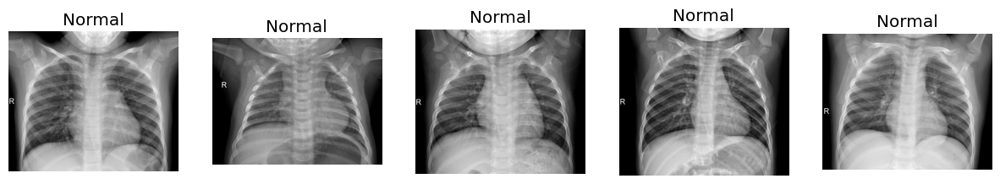

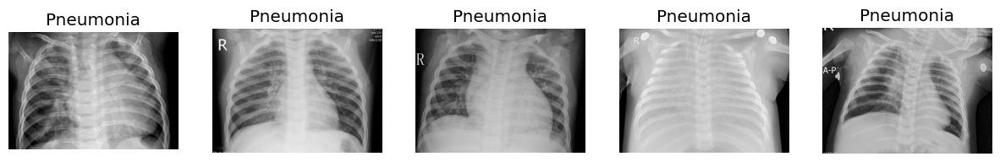

In [17]:
# Visualize 5 random images from each class in the training set
print("Random Images from Training Set:")
visualize_random_images(train_normal, 'Normal')
visualize_random_images(train_pneumonia, 'Pneumonia')

Random Images from Validation Set:


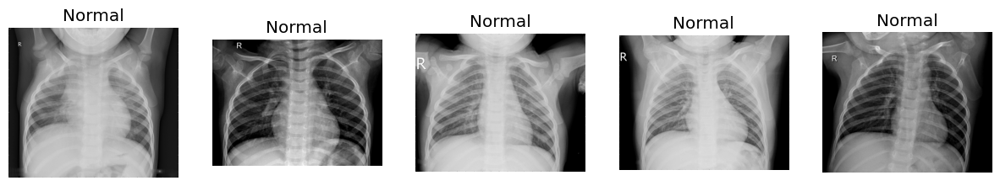

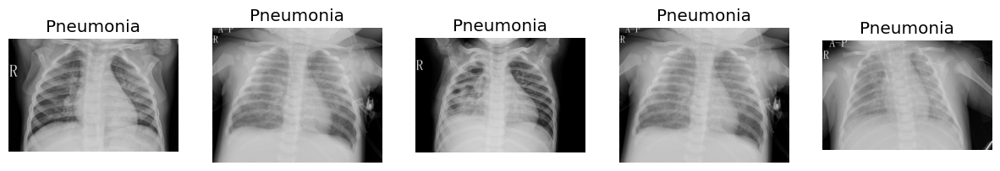

In [18]:
# Visualize 5 random images from each class in the validation set
print("Random Images from Validation Set:")
visualize_random_images(val_normal, 'Normal')
visualize_random_images(val_pneumonia, 'Pneumonia')

Random Images from Testing Set:


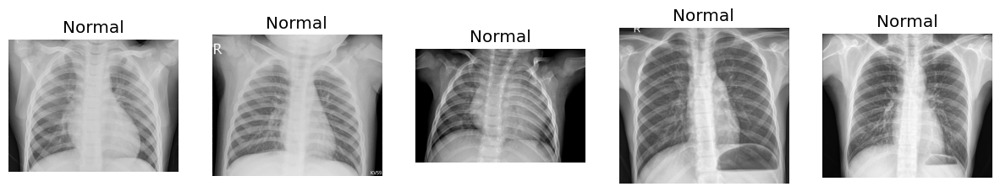

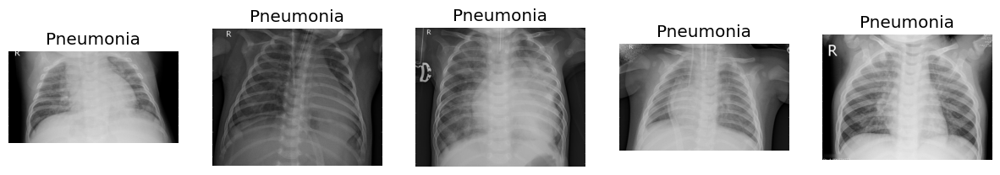

In [19]:
# Visualize 5 random images from each class in the testing set
print("Random Images from Testing Set:")
visualize_random_images(test_normal, 'Normal')
visualize_random_images(test_pneumonia, 'Pneumonia')

### Visualize Images using Ben Graham's Method

In [20]:
# Function to apply Ben Graham's method on 5 random images from a class
def visualize_images_ben_graham(dataset, title):
    plt.figure(figsize=(15,10))
    for i in range(5):
        # Choose a random image from the dataset
        random_image_path = random.choice(dataset)
        
        # Load the image
        img = cv2.imread(random_image_path)
        
        # Resize the image
        img = cv2.resize(img, (512, 512))
        
        # Convert the image to HSV
        img = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
        
        # Apply Ben Graham's method
        img = cv2.addWeighted(img, 4, cv2.GaussianBlur(img, (0,0), 512/10), -4, 128)
        
        # Display the image
        plt.subplot(2, 5, i+1)
        plt.imshow(img)
        plt.axis('off')
        plt.title(title)
    plt.show()

Images from Training Set:


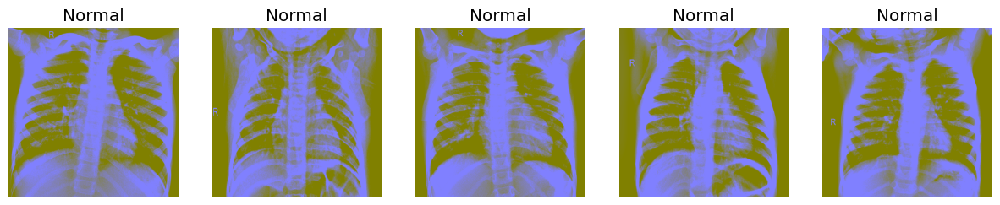

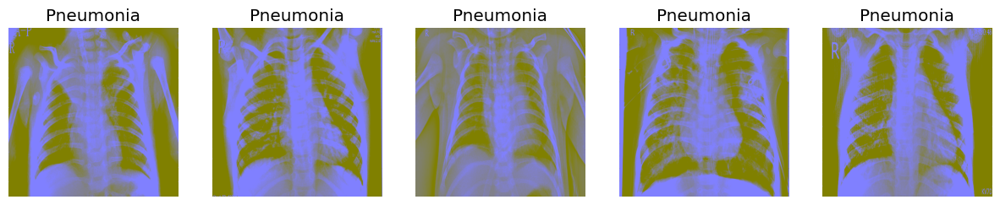

In [21]:
# Apply Ben Graham's method on 8 random images from each class in the training set
print("Images from Training Set:")
visualize_images_ben_graham(train_normal, 'Normal')
visualize_images_ben_graham(train_pneumonia, 'Pneumonia')

Images from Validation Set:


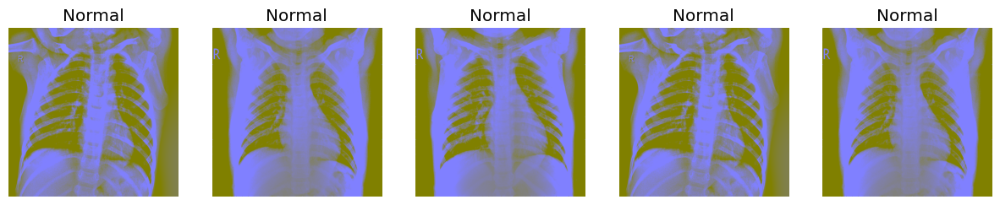

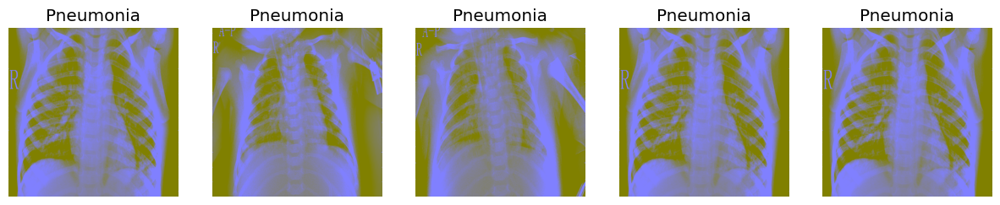

In [22]:
# Apply Ben Graham's method on 5 random images from each class in the validation set
print("Images from Validation Set:")
visualize_images_ben_graham(val_normal, 'Normal')
visualize_images_ben_graham(val_pneumonia, 'Pneumonia')

Images from Testing Set:


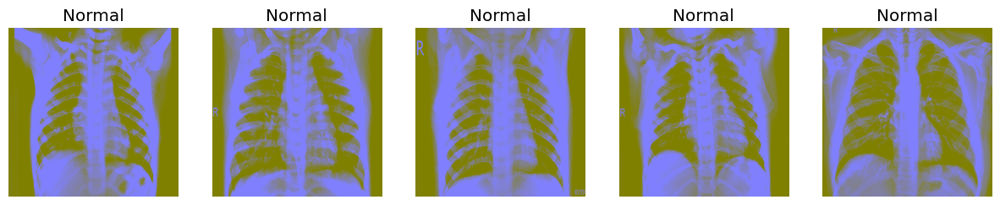

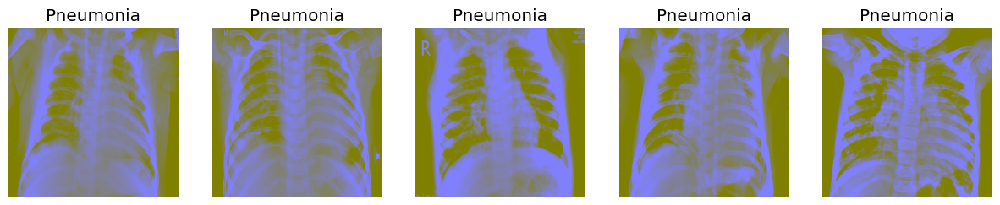

In [23]:
# Apply Ben Graham's method on 5 random images from each class in the testing set
print("Images from Testing Set:")
visualize_images_ben_graham(test_normal, 'Normal')
visualize_images_ben_graham(test_pneumonia, 'Pneumonia')

### Visualize Images with Background Subtraction

In [24]:
# Create a background subtractor
fgbg = cv2.createBackgroundSubtractorMOG2()

# Function to apply background subtraction on 5 random images from a class
def visualize_images_background_subtraction(dataset, title):
    plt.figure(figsize=(15,10))
    for i in range(5):
        # Choose a random image from the dataset
        random_image_path = random.choice(dataset)
        
        # Load the image
        img = cv2.imread(random_image_path)
        
        # Resize the image
        img = cv2.resize(img, (512, 512))
        
        # Convert the image to RGB
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        
        # Apply background subtraction
        img = fgbg.apply(img)
        
        # Display the image
        plt.subplot(1, 5, i+1)
        plt.imshow(img, cmap='gray')
        plt.axis('off')
        plt.title(title)
    plt.show()

Images from Training Set:


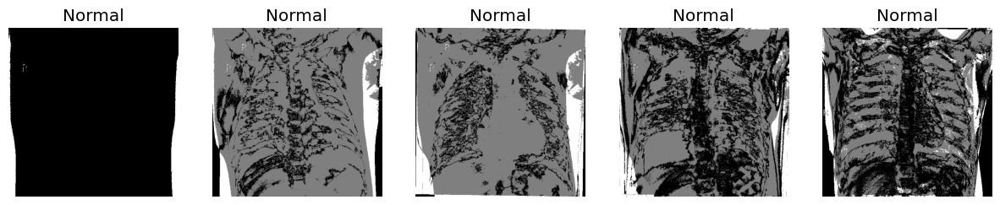

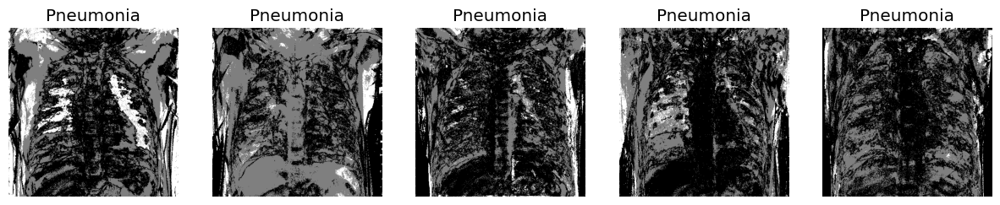

In [25]:
# Apply background subtraction on 5 random images from each class in the training set
print("Images from Training Set:")
visualize_images_background_subtraction(train_normal, 'Normal')
visualize_images_background_subtraction(train_pneumonia, 'Pneumonia')

Images from Validation Set:


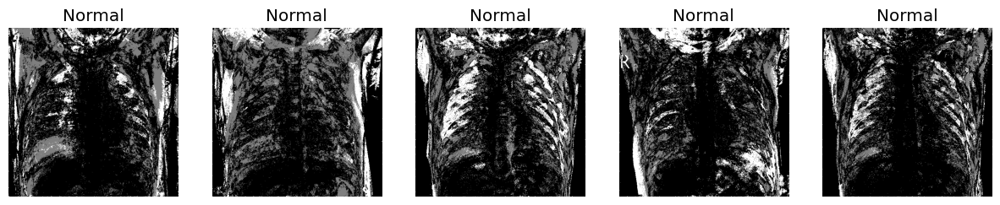

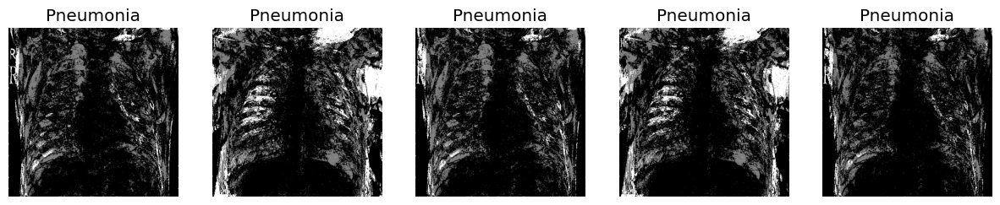

In [26]:
# Apply background subtraction on 5 random images from each class in the validation set
print("Images from Validation Set:")
visualize_images_background_subtraction(val_normal, 'Normal')
visualize_images_background_subtraction(val_pneumonia, 'Pneumonia')

Images from Testing Set:


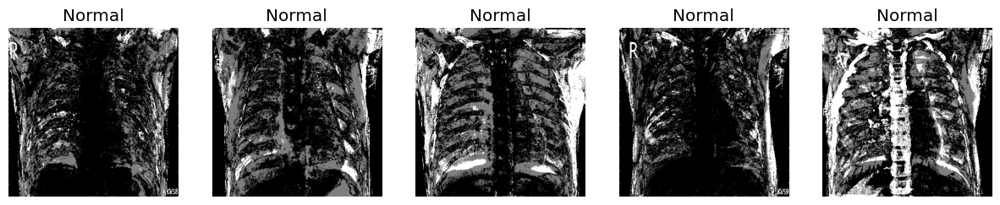

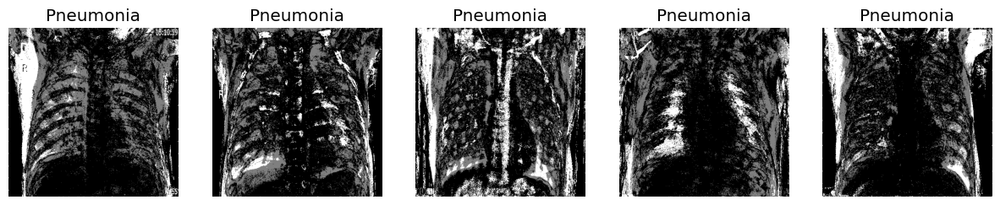

In [27]:
# Apply background subtraction on 5 random images from each class in the testing set
print("Images from Testing Set:")
visualize_images_background_subtraction(test_normal, 'Normal')
visualize_images_background_subtraction(test_pneumonia, 'Pneumonia')

### Visualizing with Albumentation Techniques

In [28]:
# Function to apply all Albumentations techniques on one chosen image from a class
def visualize_image_albumentations(dataset, title):
    # List of Albumentations techniques to apply
    albumentation_list = [A.RandomSunFlare(p=1), A.RandomFog(p=1), A.RandomBrightness(p=1),
                          A.RandomCrop(p=1,height = 512, width = 512), A.Rotate(p=1, limit=90),
                          A.RGBShift(p=1), A.RandomSnow(p=1),
                          A.HorizontalFlip(p=1), A.VerticalFlip(p=1), A.RandomContrast(limit = 0.5,p = 1),
                          A.HueSaturationValue(p=1,hue_shift_limit=20, sat_shift_limit=30, val_shift_limit=50)]
    
    # Choose one image from the dataset
    chosen_image_path = random.choice(dataset)
    
    # Load the image
    chosen_image = cv2.imread(chosen_image_path)
    
    # Apply each Albumentations technique
    img_matrix_list = []
    for aug_type in albumentation_list:
        img = aug_type(image = chosen_image)['image']
        img_matrix_list.append(img)
    
    # Add the original image to the list
    img_matrix_list.insert(0, chosen_image)
    
    # List of titles for the subplots
    titles_list = ["Original", "RandomSunFlare", "RandomFog", "RandomBrightness",
                   "RandomCrop", "Rotate", "RGBShift", "RandomSnow", "HorizontalFlip",
                   "VerticalFlip", "RandomContrast", "HSV"]
    
    # Display the images
    plt.figure(figsize=(15,10))
    for i in range(12):
        plt.subplot(3, 4, i+1)
        plt.imshow(img_matrix_list[i])
        plt.axis('off')
        plt.title(titles_list[i])
    plt.suptitle(title)
    plt.show()

Image from Training Set:


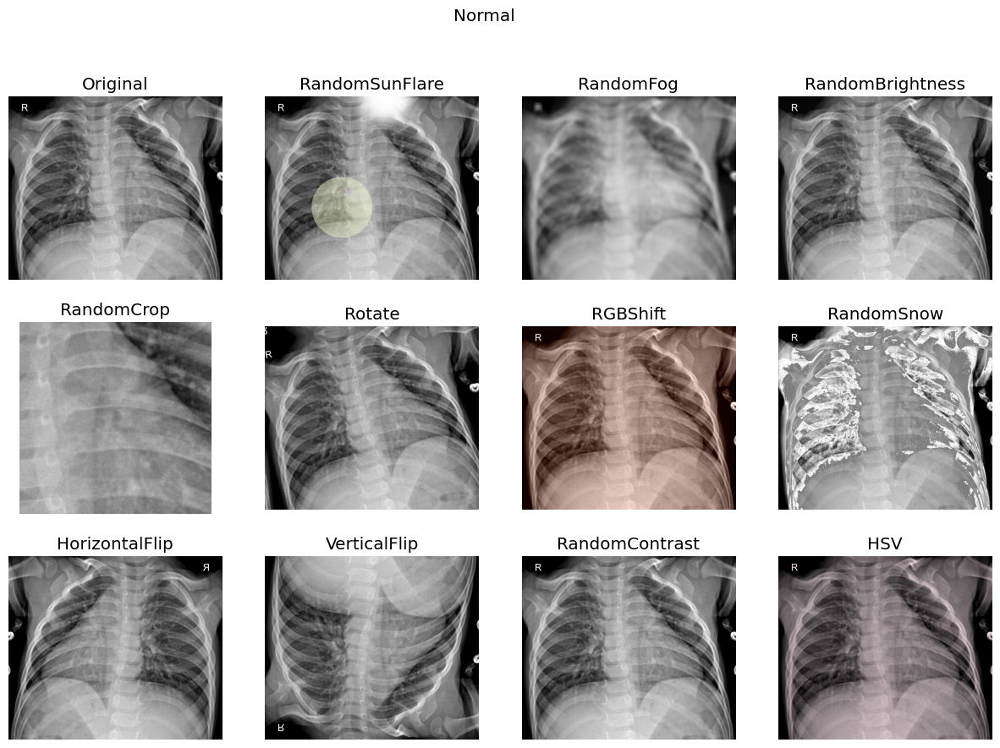

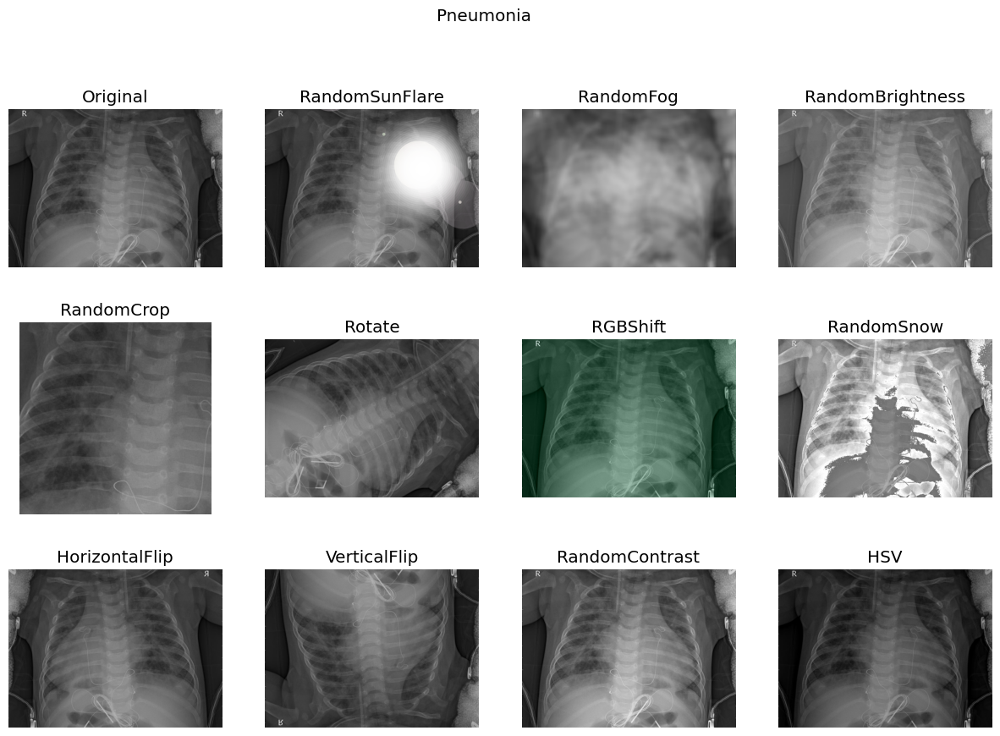

In [29]:
# Apply all Albumentations techniques on one chosen image from each class in the training set
print("Image from Training Set:")
visualize_image_albumentations(train_normal, 'Normal')
visualize_image_albumentations(train_pneumonia, 'Pneumonia')

Image from Validation Set:


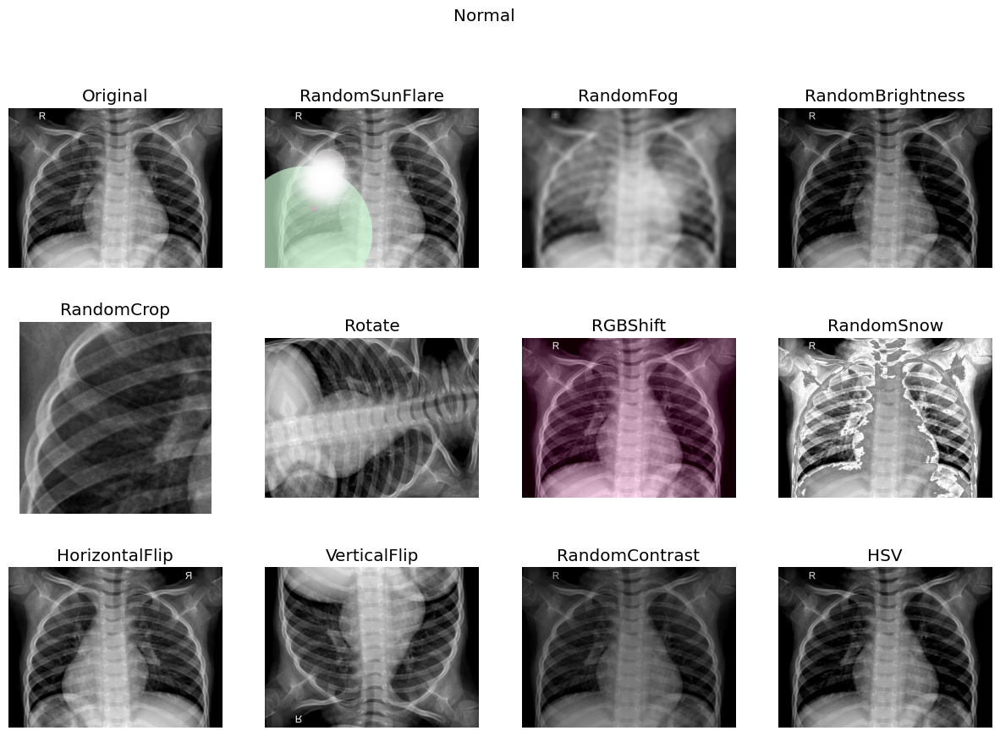

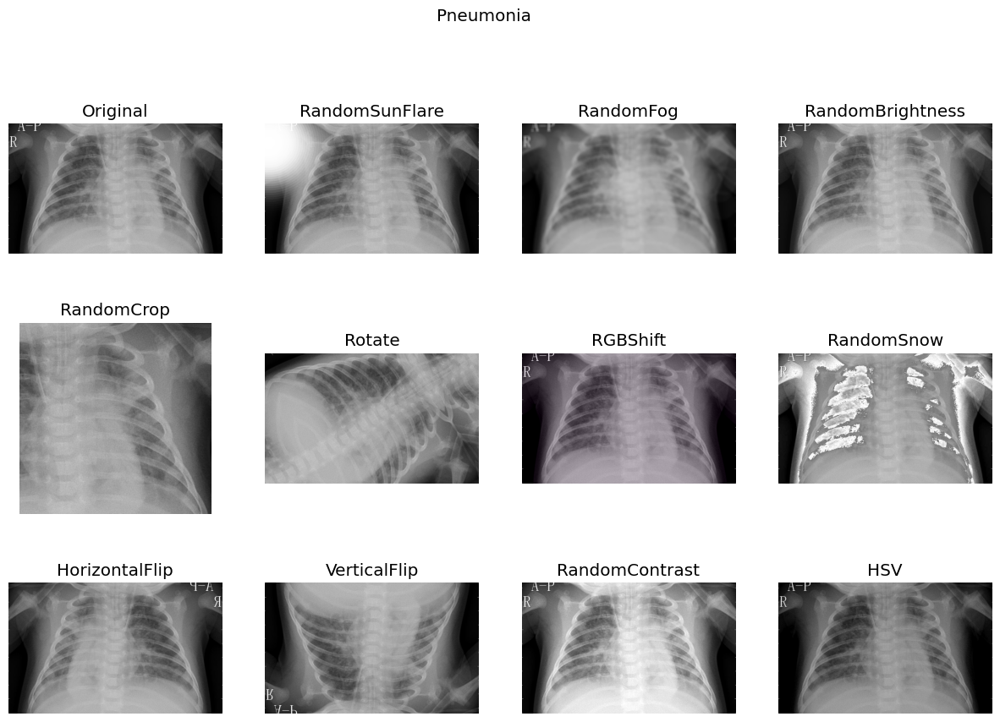

In [30]:
# Apply all Albumentations techniques on one chosen image from each class in the validation set
print("Image from Validation Set:")
visualize_image_albumentations(val_normal, 'Normal')
visualize_image_albumentations(val_pneumonia, 'Pneumonia')

Image from Testing Set:


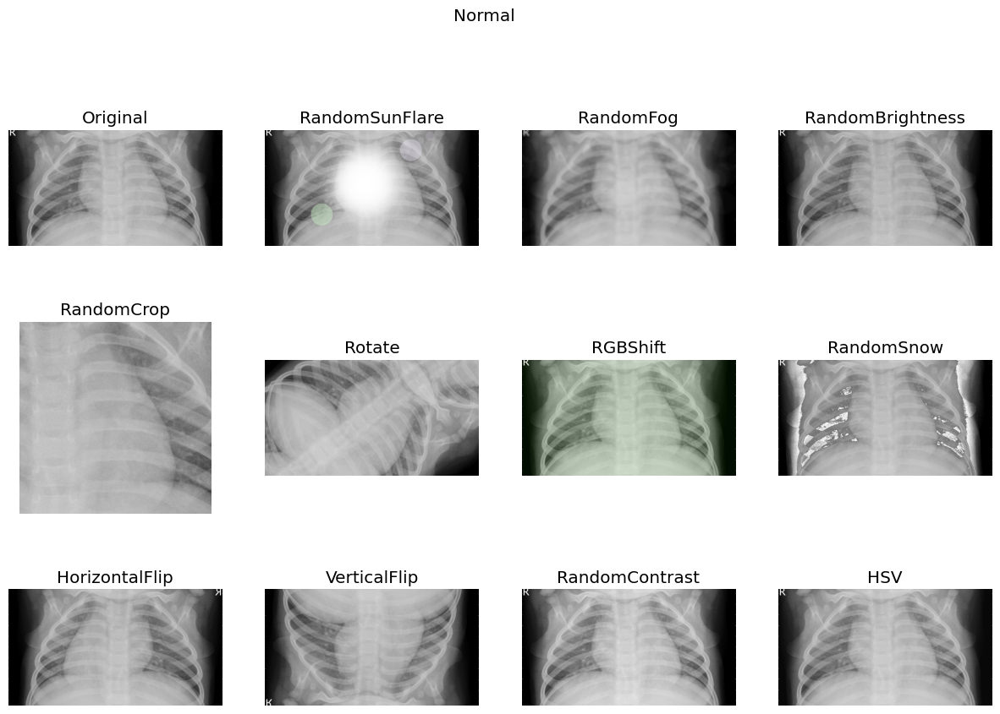

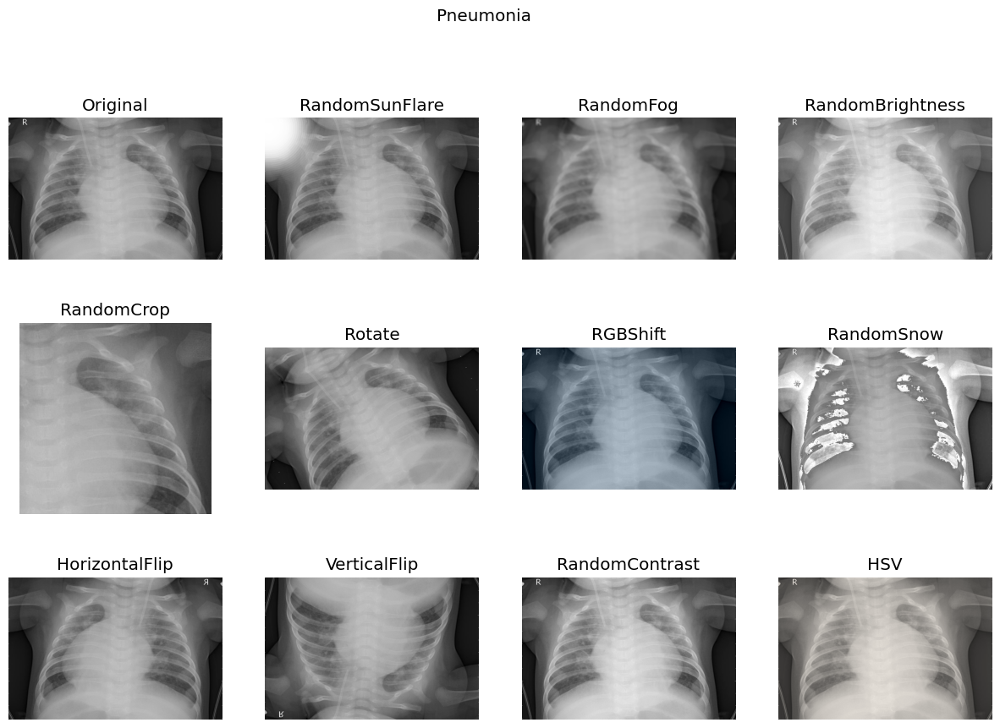

In [31]:
# Apply all Albumentations techniques on one chosen image from each class in the testing set
print("Image from Testing Set:")
visualize_image_albumentations(test_normal, 'Normal')
visualize_image_albumentations(test_pneumonia, 'Pneumonia')

### Visualize Images with Erosion

In [32]:
# Function to apply image erosion on 5 random images from a class
def visualize_images_erosion(dataset, title):
    plt.figure(figsize=(15,10))
    for i in range(5):
        # Choose a random image from the dataset
        random_image_path = random.choice(dataset)
        
        # Load the image
        img = cv2.imread(random_image_path)
        
        # Resize the image
        img = cv2.resize(img, (512, 512))
        
        # Convert the image to RGB
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        
        # Apply image erosion
        kernel = np.ones((5, 5), np.uint8)
        img_erosion = cv2.erode(img, kernel, iterations=5)
        
        # Display the image
        plt.subplot(1, 5, i+1)
        plt.imshow(img_erosion)
        plt.axis('off')
        plt.title(title)
    plt.show()

Images from Training Set:


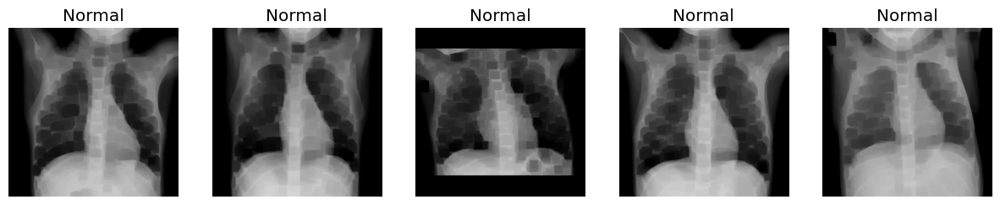

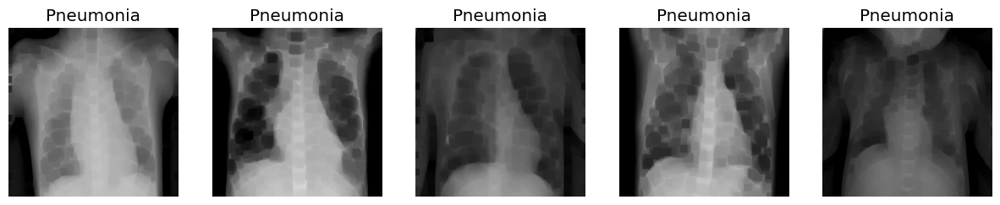

In [33]:
# Apply image erosion on 5 random images from each class in the training set
print("Images from Training Set:")
visualize_images_erosion(train_normal, 'Normal')
visualize_images_erosion(train_pneumonia, 'Pneumonia')

Images from Validation Set:


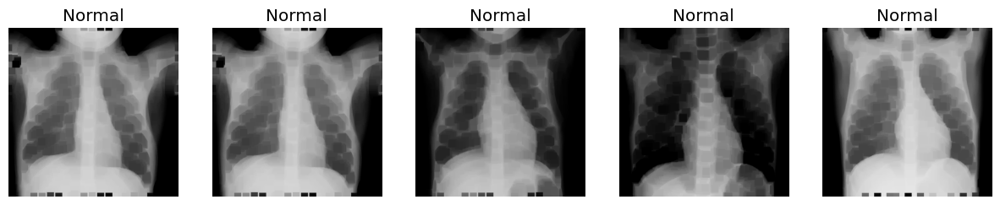

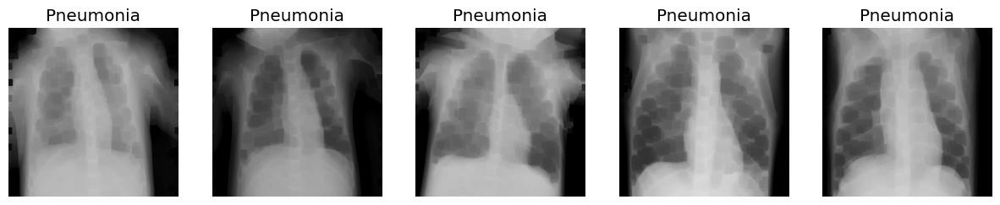

In [34]:
# Apply image erosion on 5 random images from each class in the validation set
print("Images from Validation Set:")
visualize_images_erosion(val_normal, 'Normal')
visualize_images_erosion(val_pneumonia, 'Pneumonia')

Images from Testing Set:


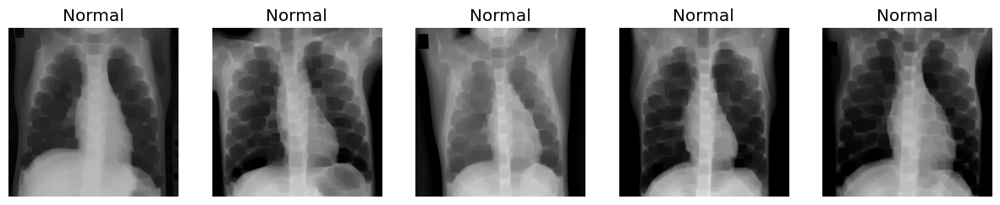

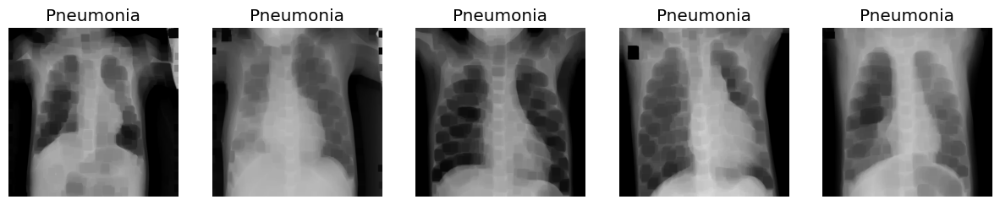

In [35]:
# Apply image erosion on 5 random images from each class in the testing set
print("Images from Testing Set:")
visualize_images_erosion(test_normal, 'Normal')
visualize_images_erosion(test_pneumonia, 'Pneumonia')

### Visualize Images with Canny Edge Detection

In [36]:
# Function to apply Canny edge detection on 5 random images from a class
def visualize_images_canny(dataset, title):
    plt.figure(figsize=(15,10))
    for i in range(5):
        # Choose a random image from the dataset
        random_image_path = random.choice(dataset)
        
        # Load the image
        img = cv2.imread(random_image_path)
        
        # Resize the image
        img = cv2.resize(img, (512, 512))
        
        # Convert the image to grayscale
        img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        
        # Apply Canny edge detection
        edges = cv2.Canny(img, 80, 100)
        
        # Display the image
        plt.subplot(1, 5, i+1)
        plt.imshow(edges)
        plt.axis('off')
        plt.title(title)
    plt.show()

Images from Training Set:


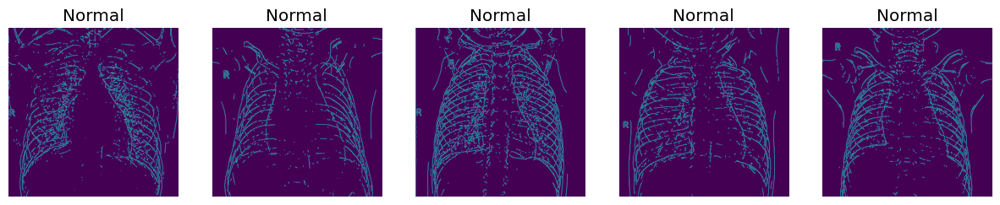

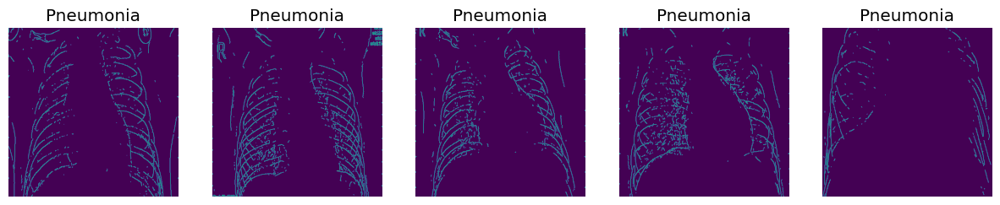

In [37]:
# Apply Canny edge detection on 5 random images from each class in the training set
print("Images from Training Set:")
visualize_images_canny(train_normal, 'Normal')
visualize_images_canny(train_pneumonia, 'Pneumonia')

Images from Validation Set:


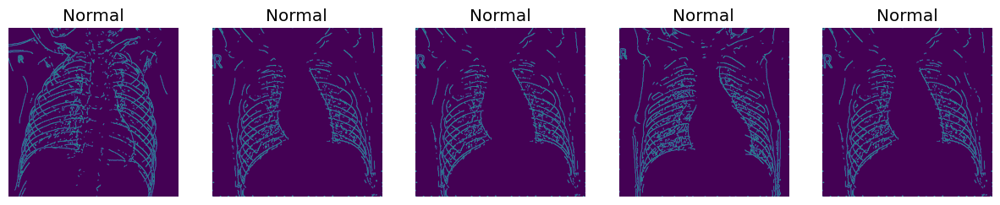

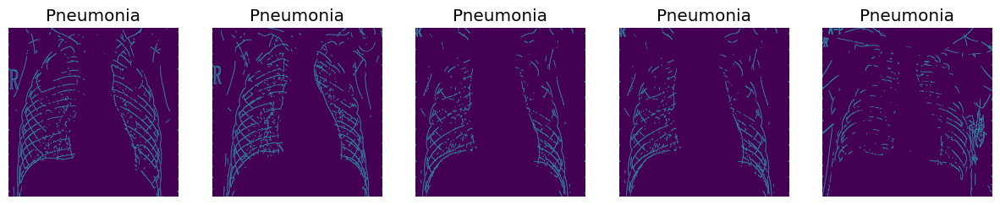

In [38]:
# Apply Canny edge detection on 5 random images from each class in the validation set
print("Images from Validation Set:")
visualize_images_canny(val_normal, 'Normal')
visualize_images_canny(val_pneumonia, 'Pneumonia')

Images from Testing Set:


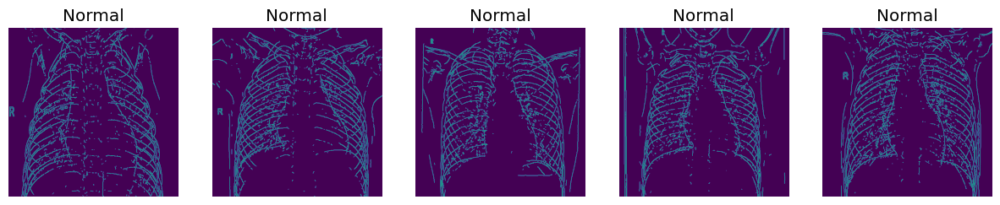

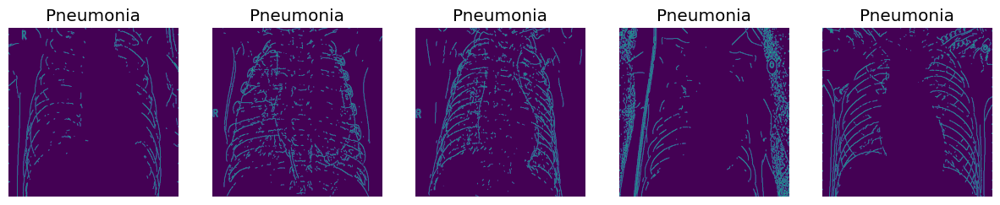

In [39]:
# Apply Canny edge detection on 5 random images from each class in the testing set
print("Images from Testing Set:")
visualize_images_canny(test_normal, 'Normal')
visualize_images_canny(test_pneumonia, 'Pneumonia')

### Visualize Images Histogram

In [40]:
# Function to plot the histogram of 1 random image from a class
def plot_img_hist(dataset, title):
    # Choose a random image from the dataset
    random_image_path = random.choice(dataset)
    
    # Load the image
    img = mpimg.imread(random_image_path)
    
    # Create a new figure
    fig = plt.figure(figsize=(10, 10))
    
    # Display the image
    fig.add_subplot(2, 2, 1)
    plt.imshow(img)
    plt.title(title)
    
    # Plot the histogram of the image
    fig.add_subplot(2, 2, 2)
    plt.hist(img.ravel(), bins=256, fc='k', ec='k')
    plt.title('Histogram')
    
    plt.tight_layout()
    plt.show()

Images from Training Set:


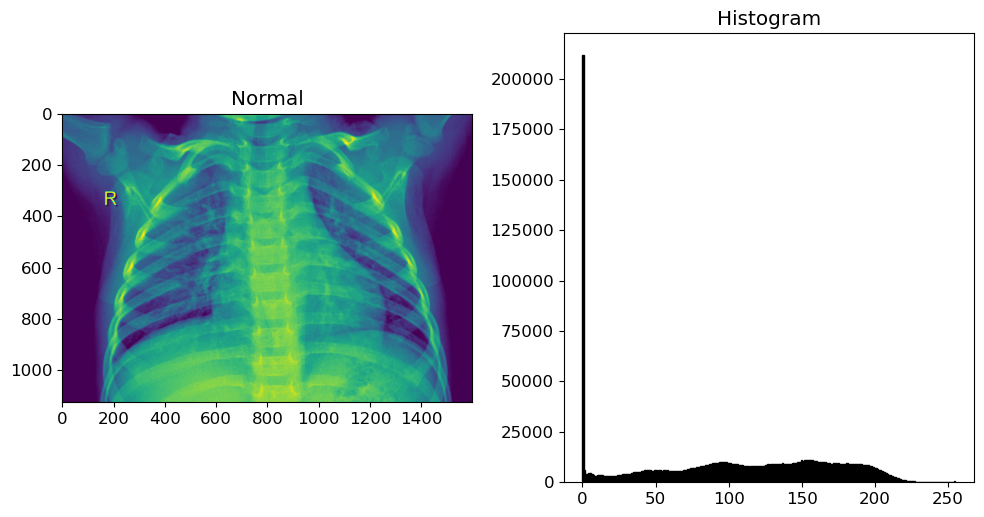

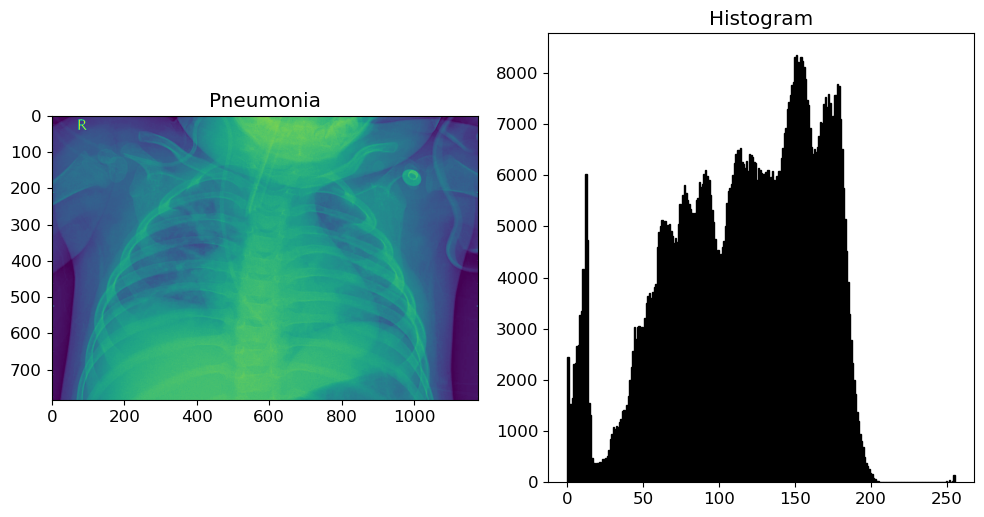

In [41]:
# Plot the histogram of 1 random image from each class in the training set
print("Images from Training Set:")
plot_img_hist(train_normal, 'Normal')
plot_img_hist(train_pneumonia, 'Pneumonia')

Images from Validation Set:


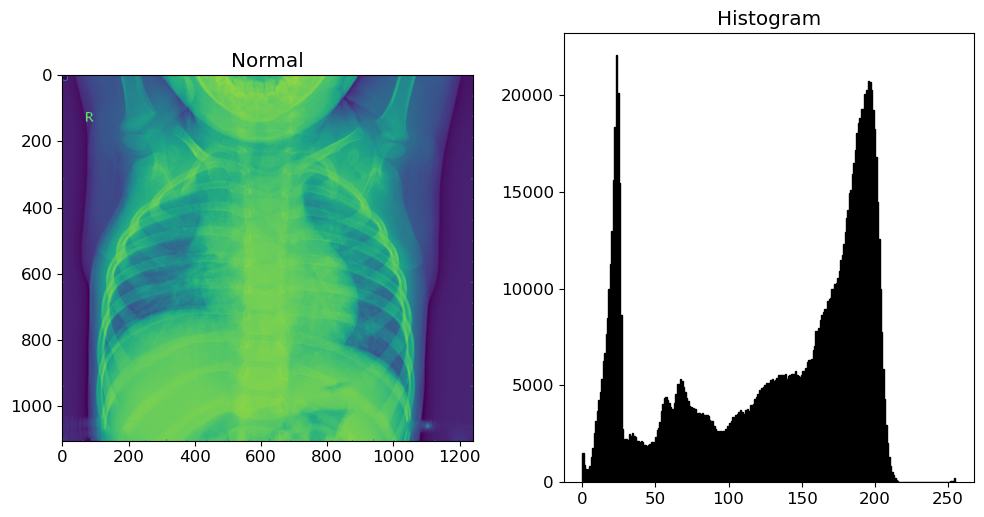

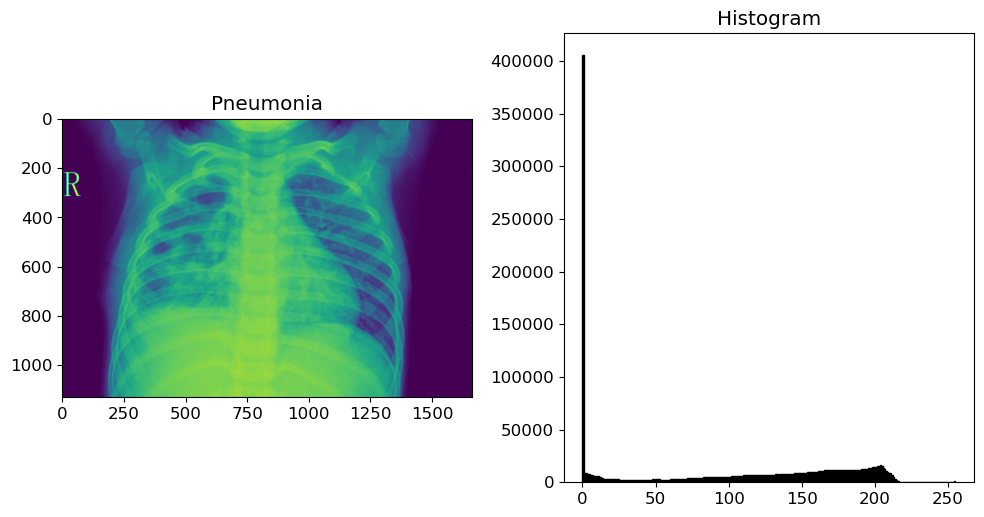

In [42]:
# Plot the histogram of 1 random image from each class in the validation set
print("Images from Validation Set:")
plot_img_hist(val_normal, 'Normal')
plot_img_hist(val_pneumonia, 'Pneumonia')

Images from Testing Set:


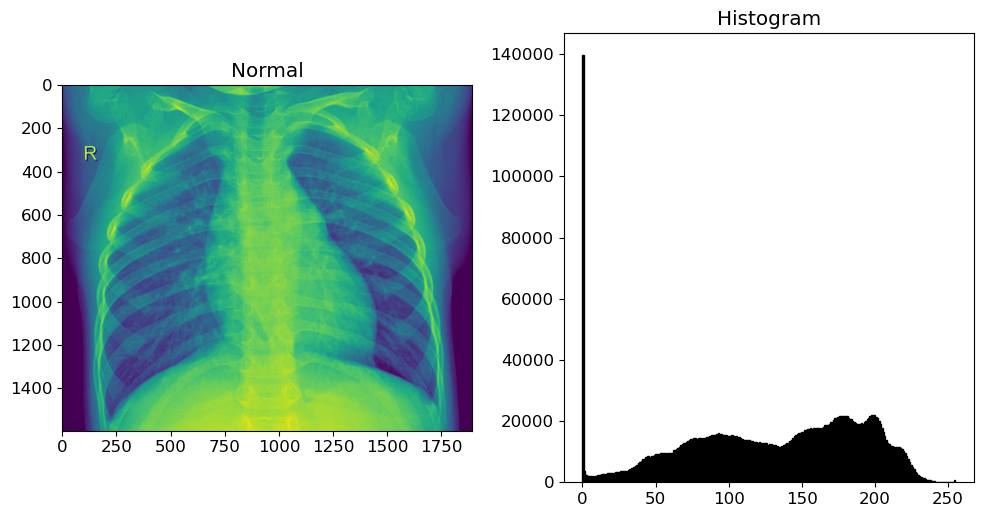

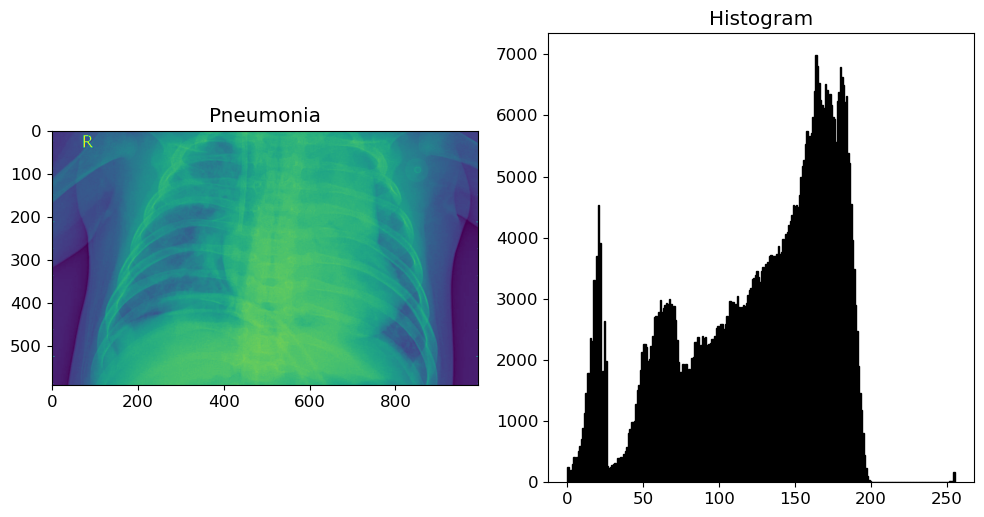

In [43]:
# Plot the histogram of 1 random image from each class in the testing set
print("Images from Testing Set:")
plot_img_hist(test_normal, 'Normal')
plot_img_hist(test_pneumonia, 'Pneumonia')

### Visualize Images CDF (Cumulative Distribution Function)

In [44]:
# Function to plot the CDF of 1 random image from a class
def plot_img_cdf(dataset, title):
    # Choose a random image from the dataset
    random_image_path = random.choice(dataset)
    
    # Load the image
    im = imageio.imread(random_image_path)
    
    # Calculate the histogram and CDF of the image
    hist = ndi.histogram(im, min=0, max=255, bins=256)
    cdf = hist.cumsum() / hist.sum()
    
    # Create a new figure
    fig = plt.figure(figsize=(10, 10))
    
    # Display the image
    fig.add_subplot(2, 2, 1)
    plt.imshow(im)
    plt.title(title)
    
    # Plot the CDF of the image
    fig.add_subplot(2, 2, 2)
    plt.plot(cdf)
    plt.title('CDF')
    
    plt.tight_layout()
    plt.show()

Images from Training Set:


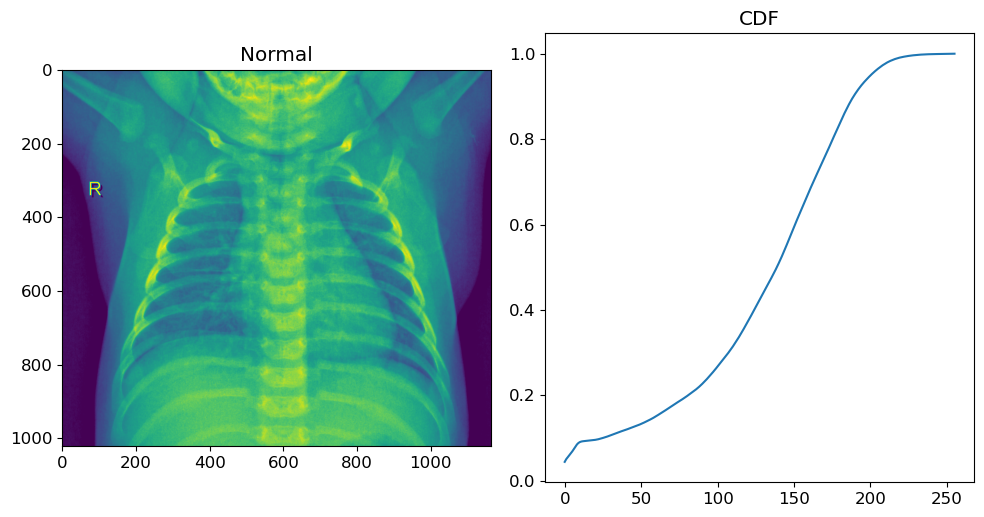

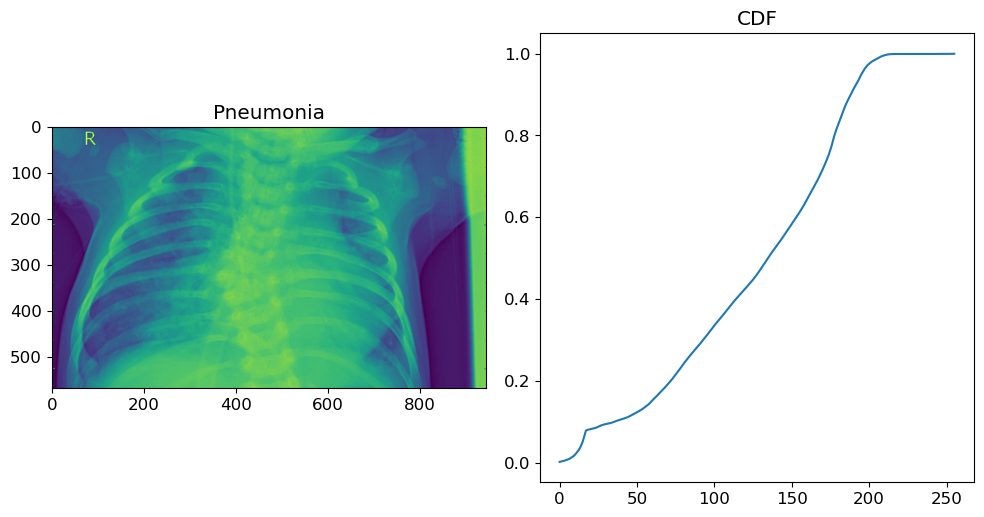

In [45]:
# Plot the CDF of 1 random image from each class in the training set
print("Images from Training Set:")
plot_img_cdf(train_normal, 'Normal')
plot_img_cdf(train_pneumonia, 'Pneumonia')

Images from Validation Set:


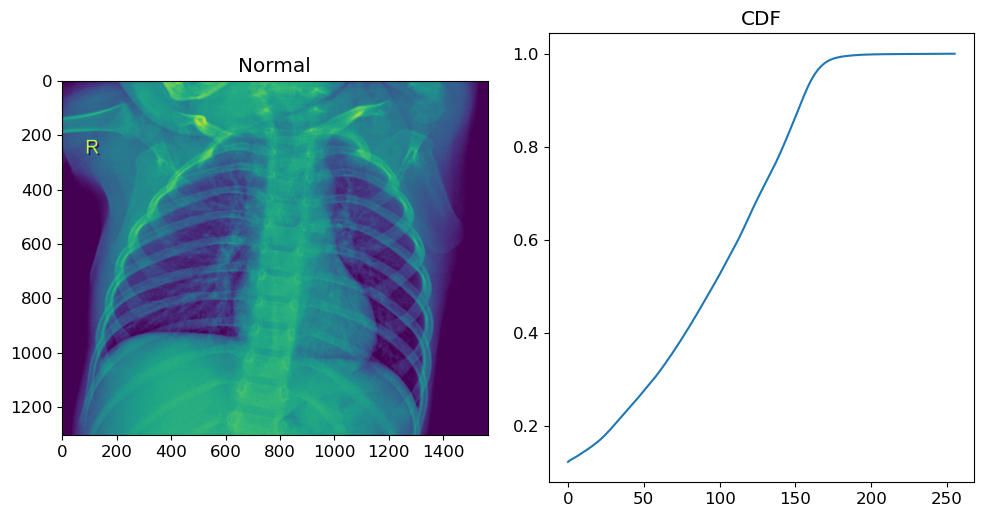

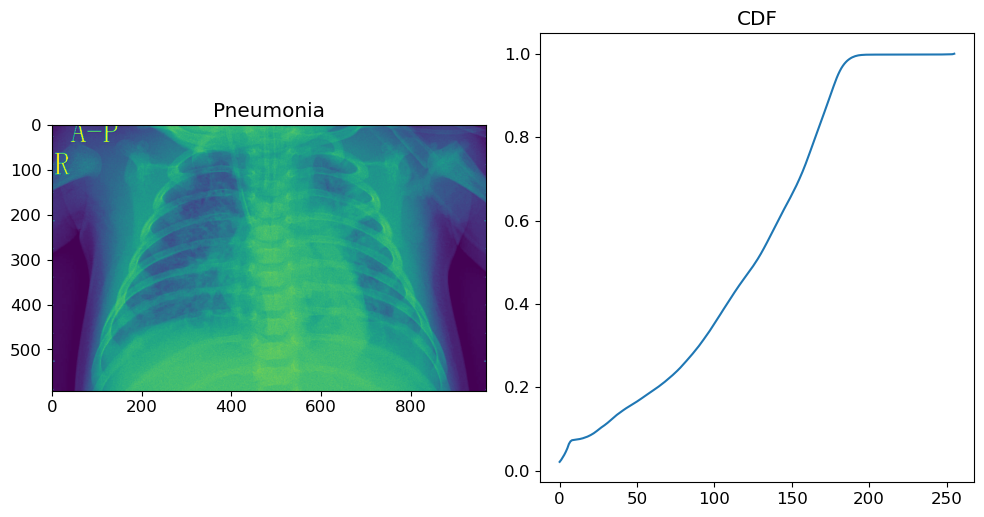

In [46]:
# Plot the CDF of 1 random image from each class in the validation set
print("Images from Validation Set:")
plot_img_cdf(val_normal, 'Normal')
plot_img_cdf(val_pneumonia, 'Pneumonia')

Images from Testing Set:


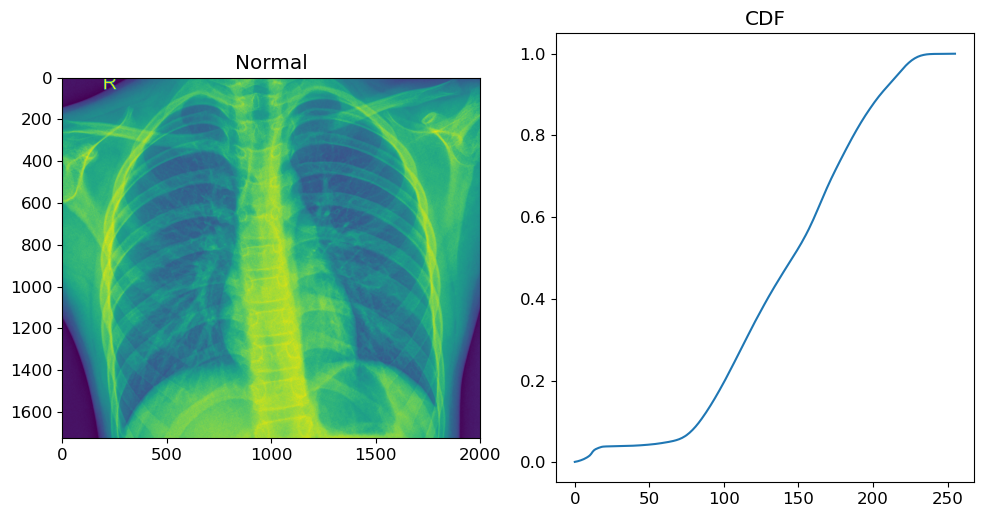

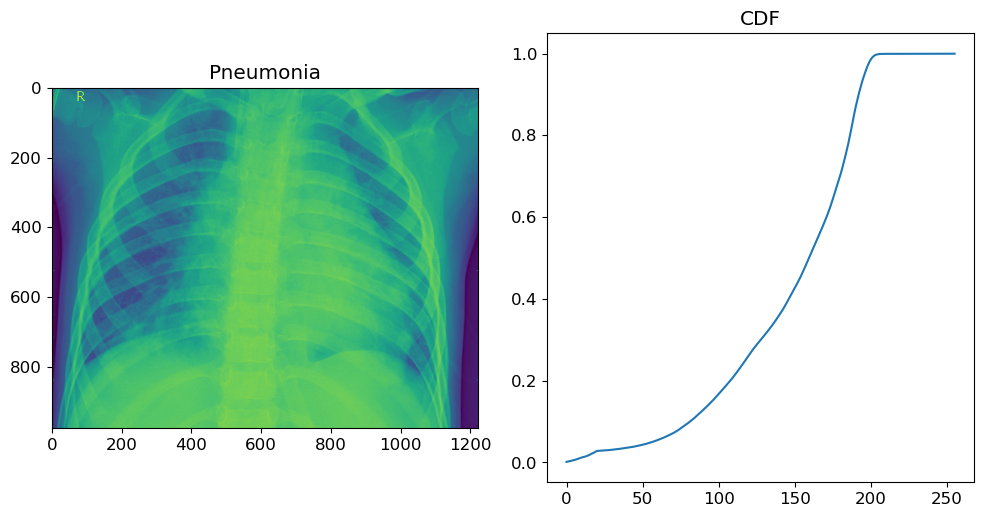

In [47]:
# Plot the CDF of 1 random image from each class in the testing set
print("Images from Testing Set:")
plot_img_cdf(test_normal, 'Normal')
plot_img_cdf(test_pneumonia, 'Pneumonia')